# Testing the models

Let's evaluate our models on the test set.
We are going to analyze accuracy, the confusion matrix, a complete classification report and the ROC curve.
Last but not least, we are going to present some of the top confident failures of the model to discuss them.  

#### Import dependencies and the test dataset Pascal VOC 2012

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

from torch.utils.data import Dataset
from PIL import Image
import os
import random
from torchvision import transforms

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc

from sklearn.preprocessing import label_binarize
from torch.nn.functional import softmax

import torch
from torchvision import models
import torch.nn as nn
from torch.utils.data import DataLoader

import matplotlib.pyplot as plt
import seaborn as sns

# Paths to VOC directories
base_dir = '/kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test'
images_dir = os.path.join(base_dir, 'JPEGImages')
sets_dir = os.path.join(base_dir, 'ImageSets/Main')


## Define the dataset 
We define some functions to augment data to make them fit for our SSL image-orientation pretext task 

In [2]:
# Function to read predefined splits
def get_files_from_split(file_path):
    with open(file_path, 'r') as f:
        files = [x.strip().split()[0] for x in f.readlines() if not x.startswith('#')]
    return files

class RotationDataset(Dataset):
    def __init__(self, file_list, root_dir, transform=None):
        """
        file_list: lista dei nomi dei file (es. ['2008_000001', ...])
        root_dir: cartella dove sono le immagini JPEG
        """
        self.file_list = file_list
        self.root_dir = root_dir
        self.transform = transform
        
        # Mappa le rotazioni in classi
        self.angle_to_label = {0: 0, 90: 1, 180: 2, 270: 3}

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        filename = self.file_list[idx]
        img_path = os.path.join(self.root_dir, filename + ".jpg")
        
        image = Image.open(img_path).convert("RGB")
        
        # 1. Scegliamo una rotazione casuale
        angle = random.choice([0, 90, 180, 270])
        
        # 2. Ruotiamo l'immagine
        # Nota: expand=True adatta la dimensione se l'img non è quadrata
        rotated_image = image.rotate(-angle, expand=True) 
        
        # 3. Creiamo la label per la rotazione
        label_rotation = self.angle_to_label[angle]
        
        # 4. Applichiamo le trasformazioni standard (Resize, ToTensor, Normalize)
        if self.transform:
            rotated_image = self.transform(rotated_image)
            
        return rotated_image, label_rotation

# Esempio di utilizzo
transform_pipeline = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transform_pipeline_inception = transforms.Compose([
    transforms.Resize(320),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transform_pipeline_efficientNetB0 = transforms.Compose([
    transforms.Resize(320),
    transforms.CenterCrop(300),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [3]:
# Get all files from test.txt
test_files = get_files_from_split(os.path.join(sets_dir, 'test.txt'))
np.random.shuffle(test_files)  # Shuffle to randomize the split

test_dataset = RotationDataset(test_files, images_dir, transform=transform_pipeline)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

test_loader = DataLoader(
    test_dataset,
    batch_size=128,
    shuffle=False
)

## The evaluation function

In [4]:
def evaluate_model(model, test_loader, class_names):

    y_preds = []
    y_labels = []
    y_probs = []

    misclassified_examples = []

    model.eval()
    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device)
            y = y.to(device)

            outputs = model(x)
            probs = softmax(outputs, dim=1)
            confs, preds = torch.max(probs, dim=1)

            # Store predictions
            y_preds.extend(preds.cpu().numpy())
            y_labels.extend(y.cpu().numpy())
            y_probs.extend(probs.cpu().numpy())

            # Store confident misclassifications
            for i in range(len(y)):
                if preds[i] != y[i]:
                    misclassified_examples.append({
                        "img": x[i].cpu(),
                        "true": y[i].item(),
                        "pred": preds[i].item(),
                        "conf": confs[i].item()
                    })

    # ---------------- Accuracy ----------------
    acc = accuracy_score(y_labels, y_preds)
    print(f"\nTest Accuracy: {acc:.4f}")

    # ---------------- Confusion Matrix ----------------
    cm = confusion_matrix(y_labels, y_preds)
    plt.figure(figsize=(6, 5))
    sns.heatmap(
        cm, annot=True, fmt='d', cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.show()

    # ---------------- Classification Report ----------------
    print("\nCLASSIFICATION REPORT")
    print(classification_report(
        y_labels,
        y_preds,
        target_names=class_names,
        digits=4
    ))

    # ---------------- ROC CURVES (One-vs-Rest) ----------------
    print("\nROC CURVES")

    num_classes = len(class_names)
    y_labels_bin = label_binarize(y_labels, classes=list(range(num_classes)))
    y_probs = np.array(y_probs)

    plt.figure(figsize=(7, 6))

    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_labels_bin[:, i], y_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.3f})")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curves (One-vs-Rest)")
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.show()

    # ---------------- TOP CONFIDENT FAILURES ----------------
    print("\n3. TOP CONFIDENT FAILURES (Visual Inspection)")
    print("These are images where the model was very confident but WRONG.")

    misclassified_examples.sort(key=lambda x: x["conf"], reverse=True)

    num_show = min(5, len(misclassified_examples))

    if num_show > 0:
        fig, axes = plt.subplots(1, num_show, figsize=(15, 4))
        if num_show == 1:
            axes = [axes]

        for i in range(num_show):
            data = misclassified_examples[i]

            # Un-normalize (ImageNet)
            img = data["img"].clone()
            mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
            std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
            img = img * std + mean
            img = torch.clamp(img, 0, 1)

            ax = axes[i]
            ax.imshow(img.permute(1, 2, 0).numpy())
            ax.axis("off")
            ax.set_title(
                f"True: {class_names[data['true']]}\n"
                f"Pred: {class_names[data['pred']]}\n"
                f"Conf: {data['conf']:.2f}",
                color="red",
                fontsize=10
            )

        plt.show()
    else:
        print("No errors found! (100% Accuracy)")

In [5]:
# Define class names (based on your rotation angles)
class_names = ['0°', '90°', '180°', '270°']

# Evaluation
## SimpleCNN full training

In [6]:
import torch.nn as nn

# Model definition: SimpleCNN
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=4):
        super(SimpleCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),
            
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),
            
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),
            
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )

        self.gap = nn.AdaptiveAvgPool2d(1)

        self.classifier = nn.Sequential(
            nn.Linear(256, 128),
            nn.Flatten(),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.gap(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.5074


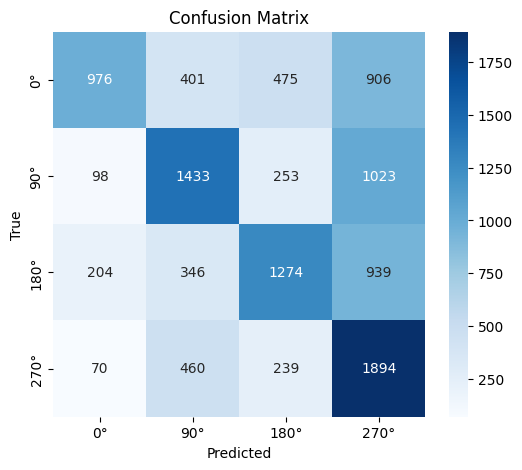


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.7240    0.3539    0.4754      2758
         90°     0.5428    0.5105    0.5262      2807
        180°     0.5685    0.4611    0.5092      2763
        270°     0.3977    0.7112    0.5102      2663

    accuracy                         0.5074     10991
   macro avg     0.5583    0.5092    0.5052     10991
weighted avg     0.5596    0.5074    0.5053     10991


ROC CURVES


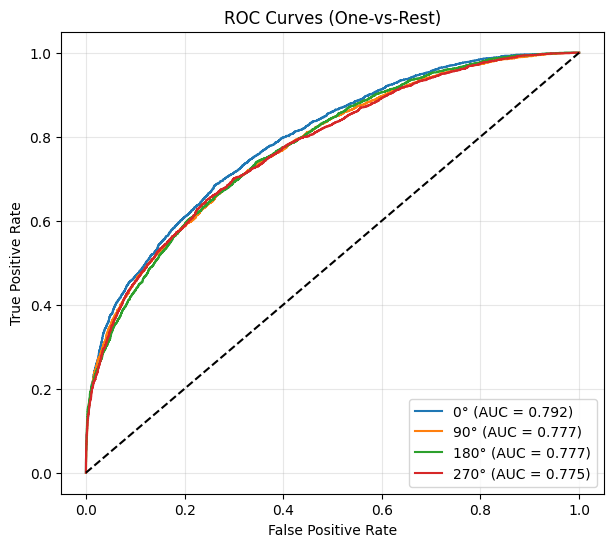


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


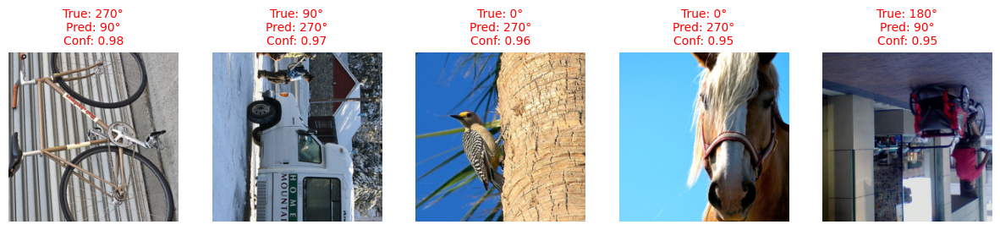

In [7]:
print("Building the model...")
model = SimpleCNN(num_classes=4)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/SimpleRotationCNN224_nocropmix.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## Simple CNN full training with CropMix

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.7974


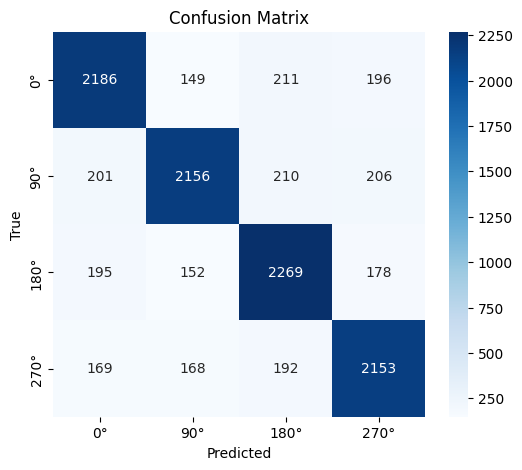


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.7946    0.7972    0.7959      2742
         90°     0.8213    0.7775    0.7988      2773
        180°     0.7873    0.8121    0.7995      2794
        270°     0.7878    0.8028    0.7952      2682

    accuracy                         0.7974     10991
   macro avg     0.7978    0.7974    0.7974     10991
weighted avg     0.7978    0.7974    0.7974     10991


ROC CURVES


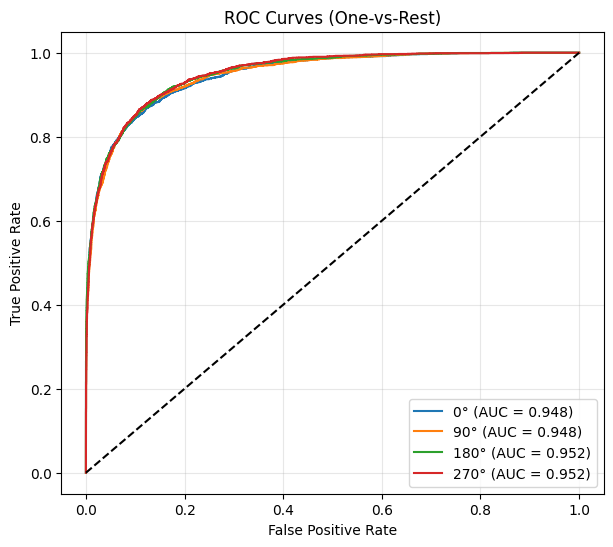


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


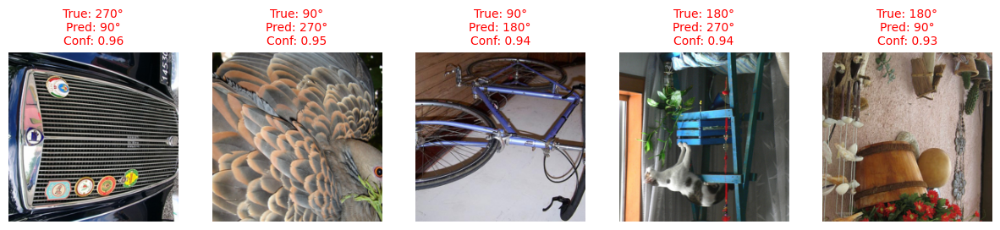

In [8]:
print("Building the model...")
model = SimpleCNN(num_classes=4)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/SimpleRotationCNN.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## ResNet18 full training 

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.8404


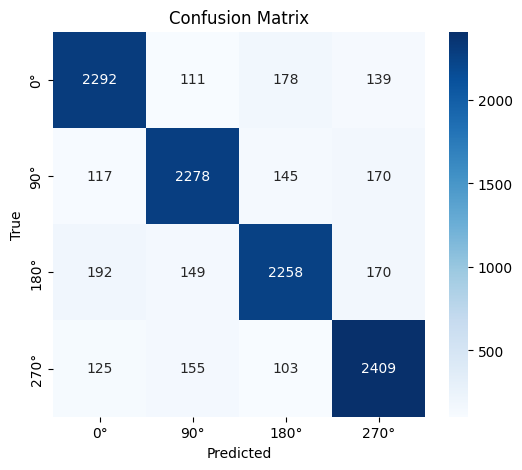


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.8408    0.8426    0.8417      2720
         90°     0.8459    0.8406    0.8432      2710
        180°     0.8413    0.8155    0.8282      2769
        270°     0.8341    0.8628    0.8482      2792

    accuracy                         0.8404     10991
   macro avg     0.8405    0.8404    0.8403     10991
weighted avg     0.8405    0.8404    0.8403     10991


ROC CURVES


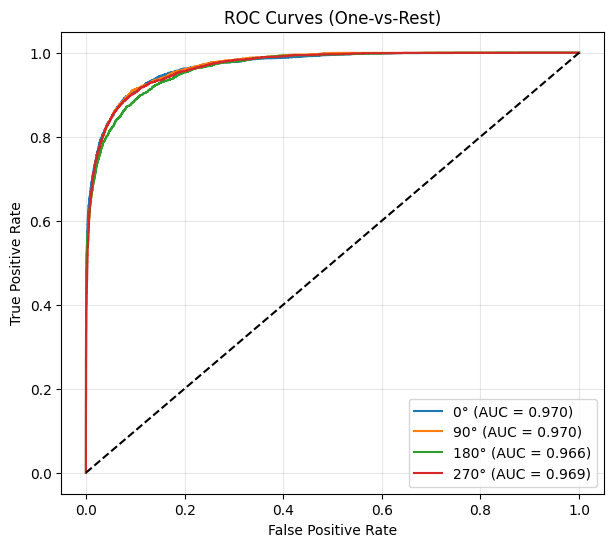


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


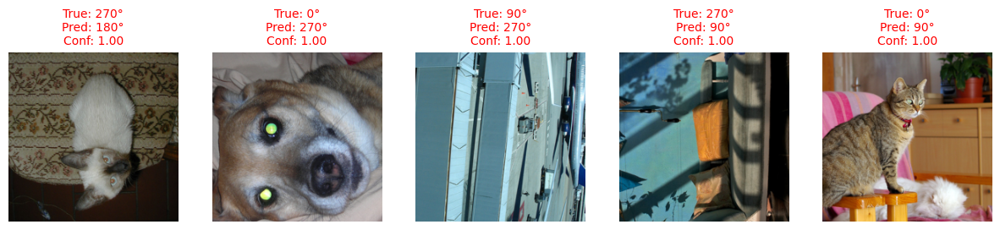

In [9]:
print("Building the model...")
model = models.resnet18(weights = None)

# Modifichiamo l'ultimo layer (Fully Connected) per avere 4 output (0, 90, 180, 270)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 4)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fullTraining_ResNet18_nocropmix.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## ResNet18 full training with CropMix

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.7214


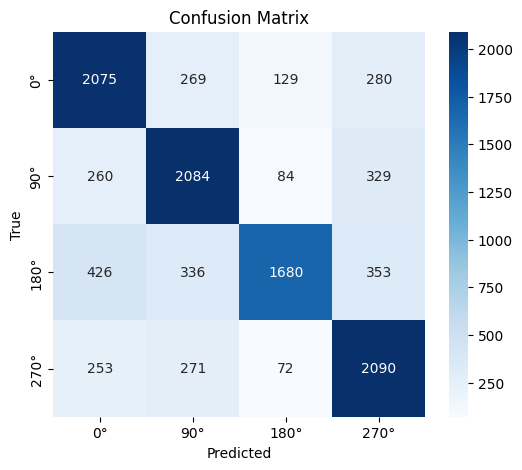


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.6885    0.7537    0.7196      2753
         90°     0.7041    0.7559    0.7291      2757
        180°     0.8550    0.6011    0.7059      2795
        270°     0.6848    0.7781    0.7285      2686

    accuracy                         0.7214     10991
   macro avg     0.7331    0.7222    0.7208     10991
weighted avg     0.7338    0.7214    0.7207     10991


ROC CURVES


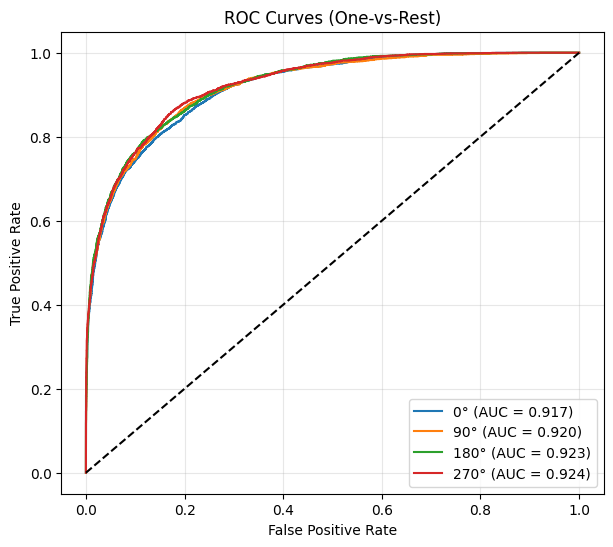


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


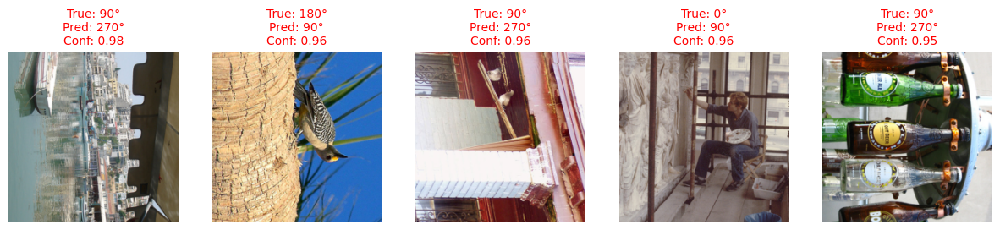

In [10]:
print("Building the model...")
model = models.resnet18(weights = None)

# Modifichiamo l'ultimo layer (Fully Connected) per avere 4 output (0, 90, 180, 270)
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_ftrs, num_ftrs),  # Hidden layer (maintains size or reduces)
    nn.ReLU(),                      # Non-linearity (Crucial!)
    nn.Linear(num_ftrs, 4)          # Output layer
)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fullTraining_ResNet18.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## ResNet18 fine-tuning

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.9287


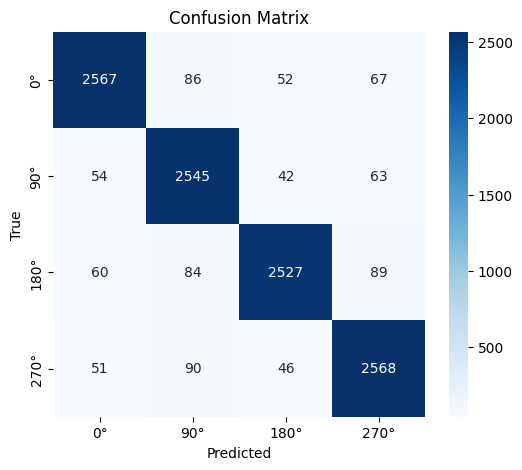


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.9396    0.9260    0.9328      2772
         90°     0.9073    0.9412    0.9239      2704
        180°     0.9475    0.9156    0.9313      2760
        270°     0.9214    0.9321    0.9267      2755

    accuracy                         0.9287     10991
   macro avg     0.9290    0.9287    0.9287     10991
weighted avg     0.9291    0.9287    0.9287     10991


ROC CURVES


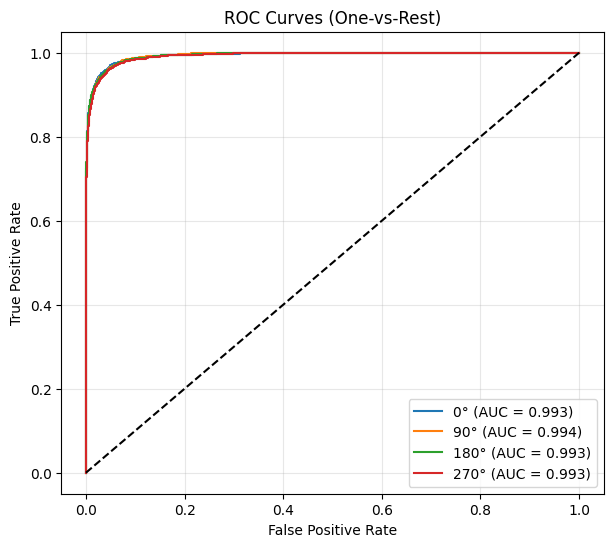


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


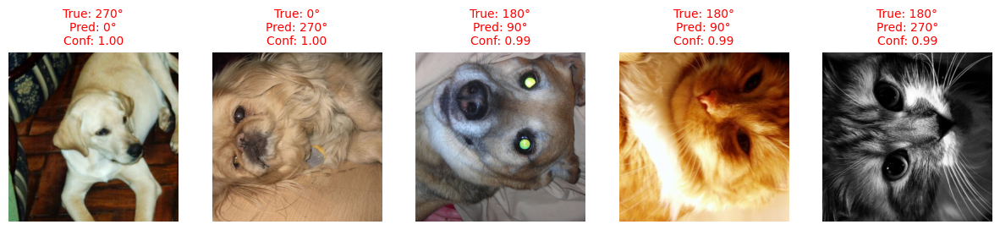

In [26]:
print("Building the model...")
model = models.resnet18(weights=None)

# Modifichiamo l'ultimo layer (Fully Connected) per avere 4 output (0, 90, 180, 270)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 4) 

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/2/fineTuning_ResNet18.pth", map_location=device))

model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## ResNet50 full training 

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.6918


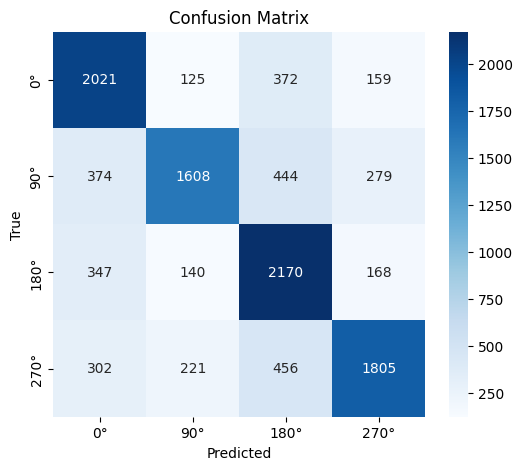


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.6639    0.7549    0.7065      2677
         90°     0.7679    0.5945    0.6701      2705
        180°     0.6304    0.7681    0.6925      2825
        270°     0.7487    0.6483    0.6949      2784

    accuracy                         0.6918     10991
   macro avg     0.7027    0.6915    0.6910     10991
weighted avg     0.7024    0.6918    0.6910     10991


ROC CURVES


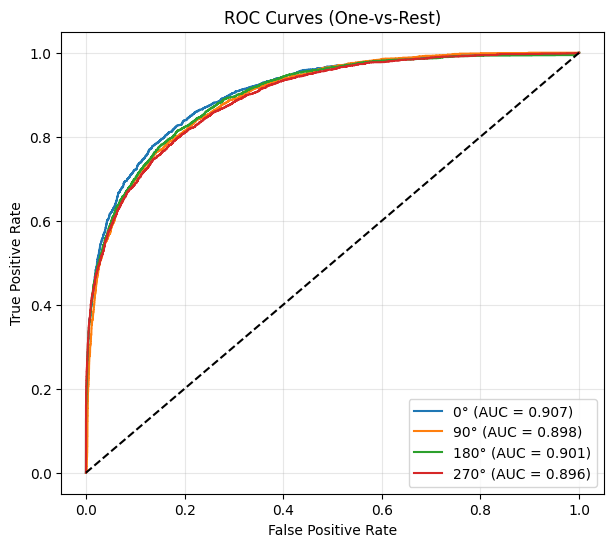


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


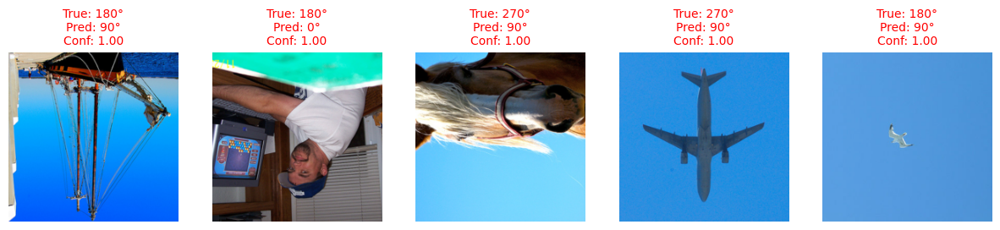

In [12]:
print("Building the model...")
model = models.resnet50(weights = None)

# Modifichiamo l'ultimo layer (Fully Connected) per avere 4 output (0, 90, 180, 270)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 4) 

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fullTraining_ResNet50_nocropmix.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## ResNet50 full training with CropMix

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.7992


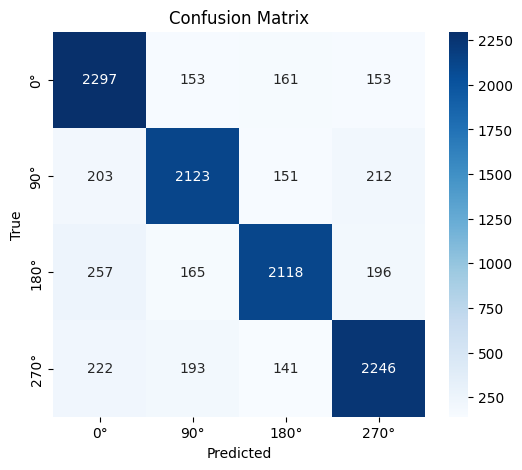


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.7711    0.8310    0.7999      2764
         90°     0.8060    0.7895    0.7977      2689
        180°     0.8238    0.7741    0.7982      2736
        270°     0.8001    0.8016    0.8009      2802

    accuracy                         0.7992     10991
   macro avg     0.8003    0.7991    0.7992     10991
weighted avg     0.8002    0.7992    0.7992     10991


ROC CURVES


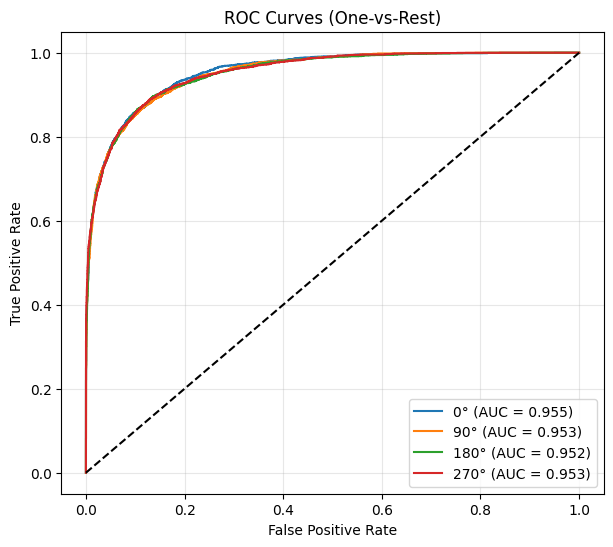


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


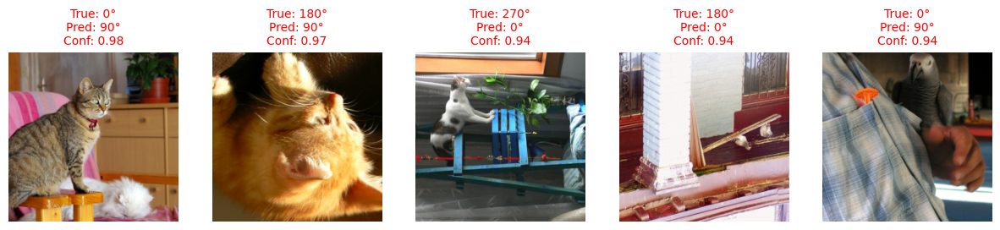

In [13]:
print("Building the model...")
model = models.resnet50(weights=None)

num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_ftrs, num_ftrs),  # Hidden layer (maintains size or reduces)
    nn.ReLU(),                      
    nn.Linear(num_ftrs, 4)          
)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fullTraining_ResNet50.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## ResNet50 fine-tuning

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.8925


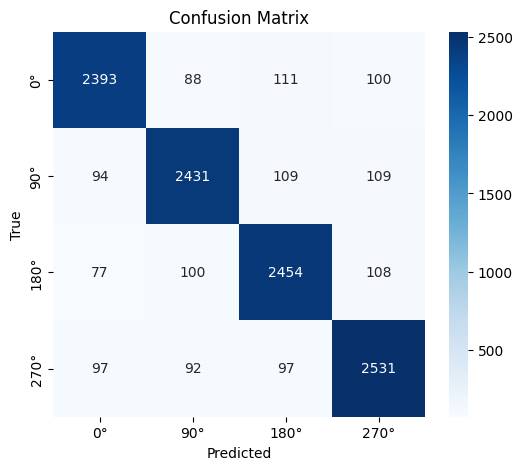


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.8993    0.8889    0.8941      2692
         90°     0.8967    0.8863    0.8915      2743
        180°     0.8856    0.8959    0.8907      2739
        270°     0.8887    0.8985    0.8936      2817

    accuracy                         0.8925     10991
   macro avg     0.8926    0.8924    0.8925     10991
weighted avg     0.8925    0.8925    0.8925     10991


ROC CURVES


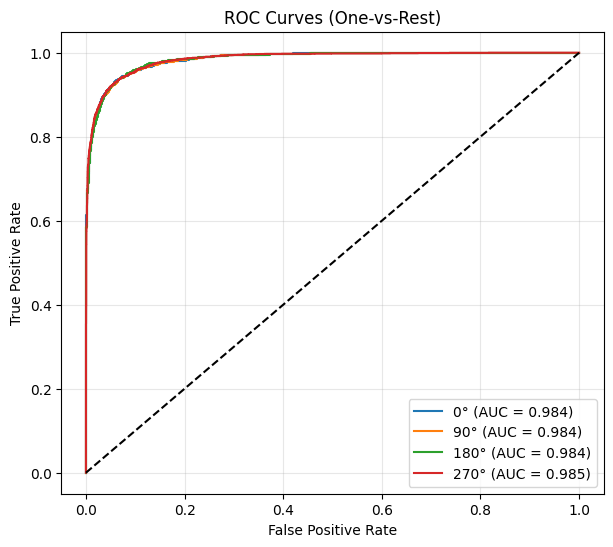


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


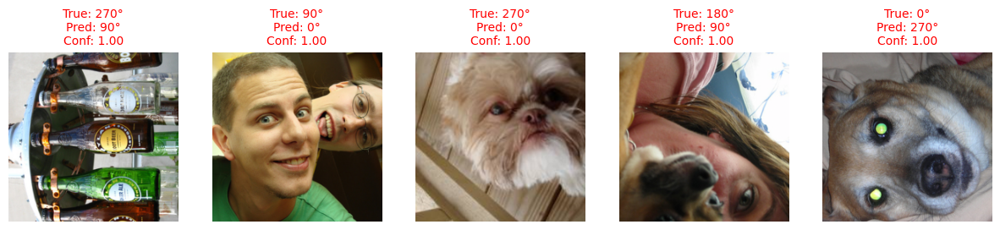

In [14]:
print("Building the model...")
model = models.resnet50(weights=None)

# Modifichiamo l'ultimo layer (Fully Connected) per avere 4 output (0, 90, 180, 270)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 4) 

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fineTuning_ResNet50.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## EfficientNet_B3 full training

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.8108


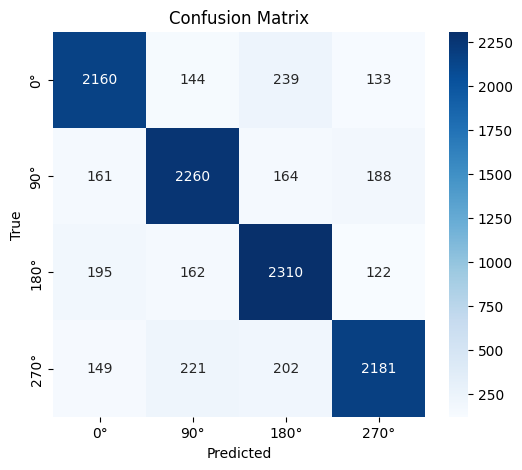


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.8105    0.8072    0.8088      2676
         90°     0.8109    0.8150    0.8129      2773
        180°     0.7925    0.8283    0.8100      2789
        270°     0.8312    0.7922    0.8112      2753

    accuracy                         0.8108     10991
   macro avg     0.8113    0.8107    0.8107     10991
weighted avg     0.8112    0.8108    0.8108     10991


ROC CURVES


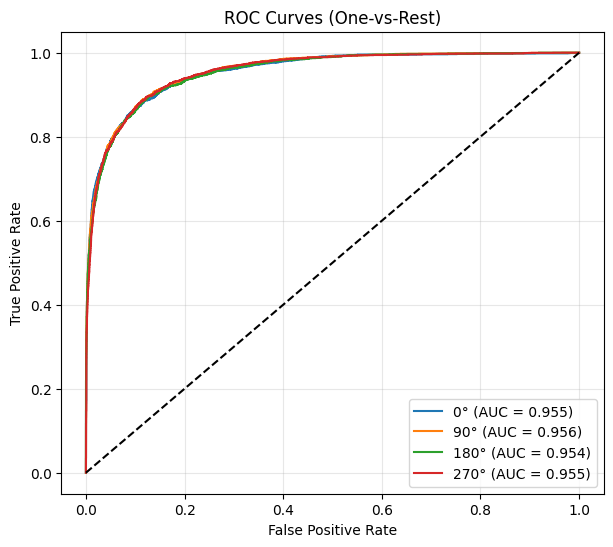


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


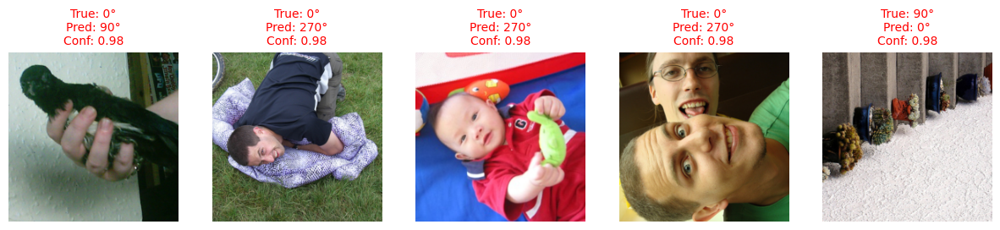

In [15]:
print("Building the model...")
model = models.efficientnet_b3(weights=None)

num_ftrs = model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(num_ftrs, num_ftrs),  # hidden layer 1536 → 1536
    nn.ReLU(),
    nn.Linear(num_ftrs, 4)          # output layer
)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fullTraining_EfficientNetB3_nocropmix.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## EfficientNet_B3 full training with CropMix

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.6937


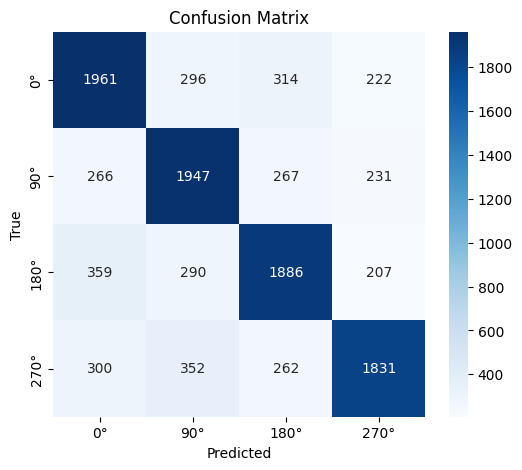


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.6795    0.7021    0.6906      2793
         90°     0.6749    0.7182    0.6959      2711
        180°     0.6911    0.6878    0.6895      2742
        270°     0.7350    0.6670    0.6994      2745

    accuracy                         0.6937     10991
   macro avg     0.6951    0.6938    0.6938     10991
weighted avg     0.6951    0.6937    0.6938     10991


ROC CURVES


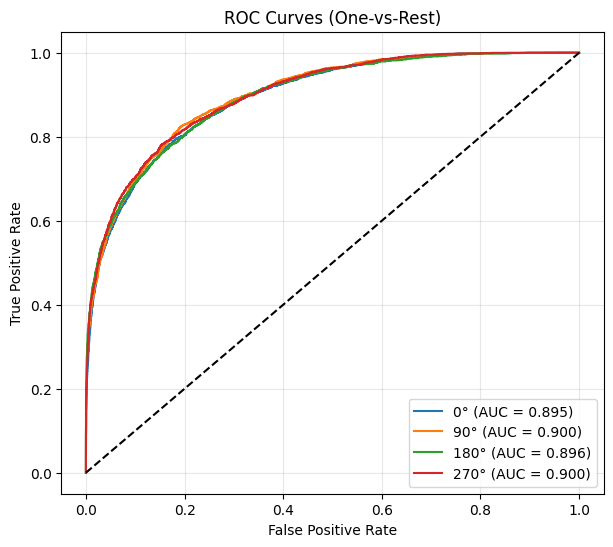


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


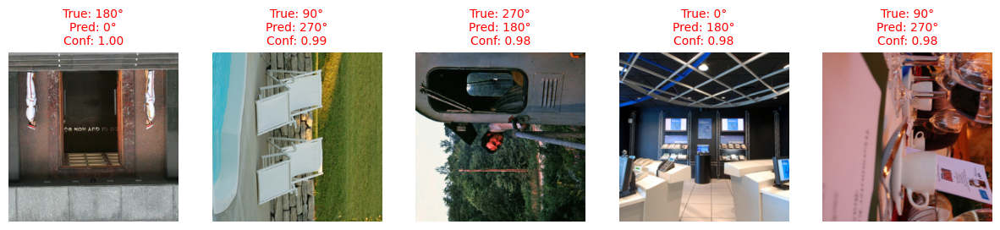

In [16]:
print("Building the model...")
model = models.efficientnet_b3(weights = None)

# Modifichiamo l'ultimo layer (Fully Connected) per avere 4 output (0, 90, 180, 270)
num_ftrs = model.classifier[1].in_features

# 2. Definiamo la nuova sequenza
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(num_ftrs, 4)
)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fullTraining_EfficientNetB3.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## EfficientNet_B3 fine-tuning

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.9093


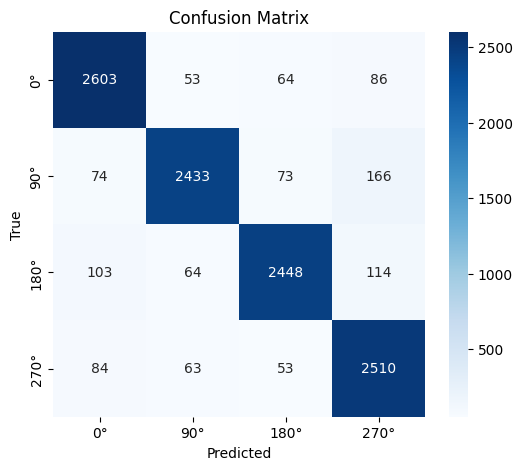


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.9089    0.9277    0.9182      2806
         90°     0.9311    0.8860    0.9080      2746
        180°     0.9280    0.8970    0.9122      2729
        270°     0.8727    0.9262    0.8987      2710

    accuracy                         0.9093     10991
   macro avg     0.9102    0.9092    0.9093     10991
weighted avg     0.9103    0.9093    0.9094     10991


ROC CURVES


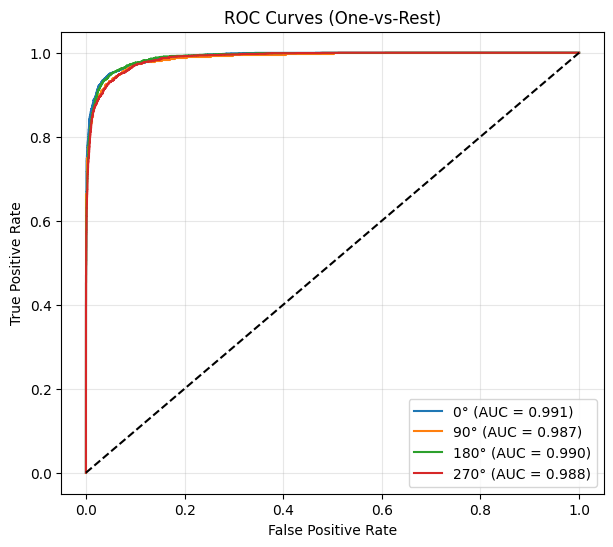


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


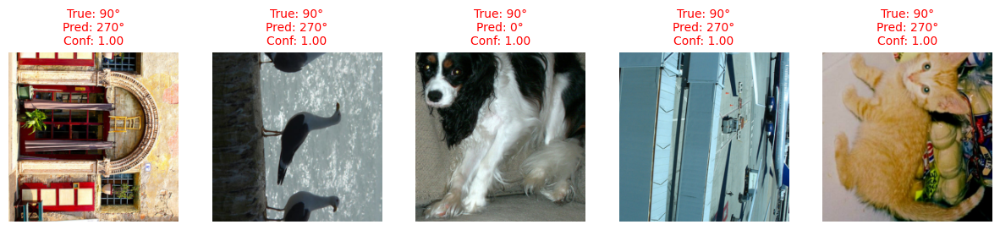

In [17]:
print("Building the model...")
model = models.efficientnet_b3(weights=None)
    
num_ftrs = model.classifier[1].in_features
model.classifier[1] = nn.Linear(num_ftrs, 4)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fineTuning_EfficientNetB3.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## EfficientNet_B0 full training

EfficientNet B0 use a different image shape tipically, so let's build the dataset with images of size 300x300.

In [18]:
print("Adjusting the dataset for EfficientNetB0...")
test_dataset = RotationDataset(test_files, images_dir, transform=transform_pipeline_efficientNetB0)

test_loader = DataLoader(
    test_dataset,
    batch_size=128,
    shuffle=False
)

Adjusting the dataset for EfficientNetB0...


Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.8130


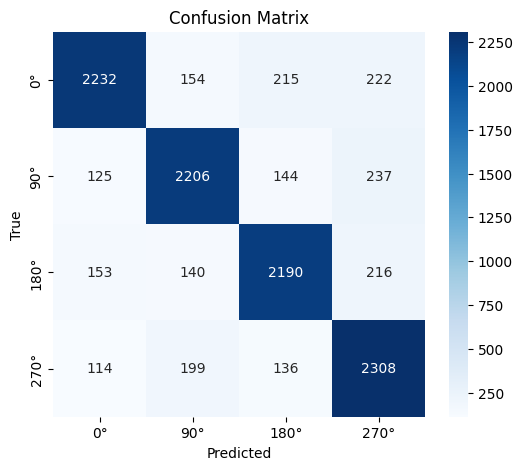


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.8506    0.7906    0.8195      2823
         90°     0.8173    0.8134    0.8154      2712
        180°     0.8156    0.8114    0.8135      2699
        270°     0.7737    0.8371    0.8042      2757

    accuracy                         0.8130     10991
   macro avg     0.8143    0.8132    0.8132     10991
weighted avg     0.8145    0.8130    0.8132     10991


ROC CURVES


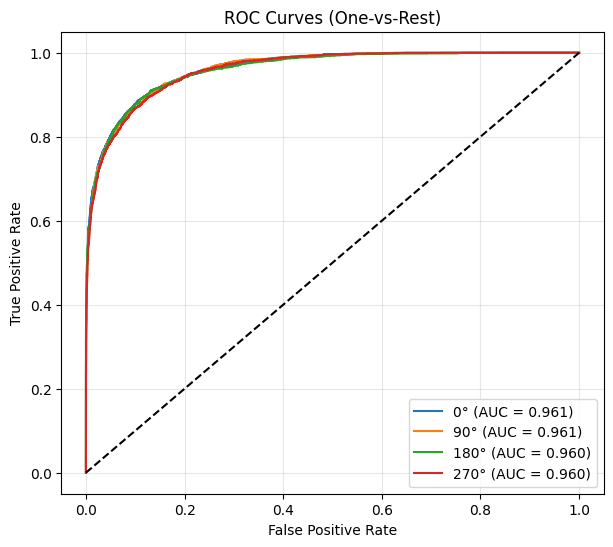


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


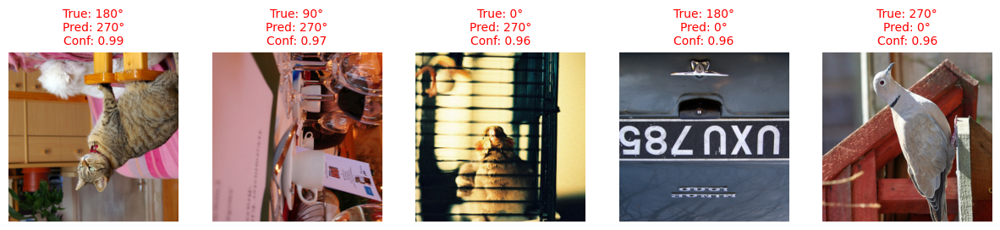

In [19]:
print("Building the model...")
model = models.efficientnet_b0(weights = None)

# Modifichiamo l'ultimo layer (Fully Connected) per avere 4 output (0, 90, 180, 270)
num_ftrs = model.classifier[1].in_features

# 2. Definiamo la nuova sequenza
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),    
    nn.Linear(num_ftrs, num_ftrs),      
    nn.ReLU(),                          
    nn.Linear(num_ftrs, 4) 
)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fullTraining_EfficientNetB0_nocropmix.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## EfficientNet_B0 full training with CropMix

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.5344


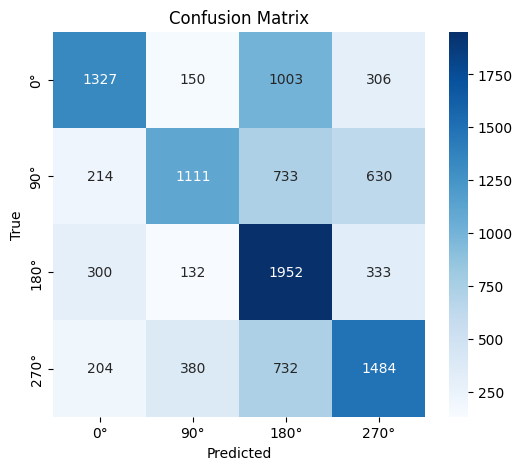


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.6489    0.4763    0.5494      2786
         90°     0.6266    0.4133    0.4981      2688
        180°     0.4416    0.7184    0.5470      2717
        270°     0.5390    0.5300    0.5345      2800

    accuracy                         0.5344     10991
   macro avg     0.5640    0.5345    0.5322     10991
weighted avg     0.5642    0.5344    0.5325     10991


ROC CURVES


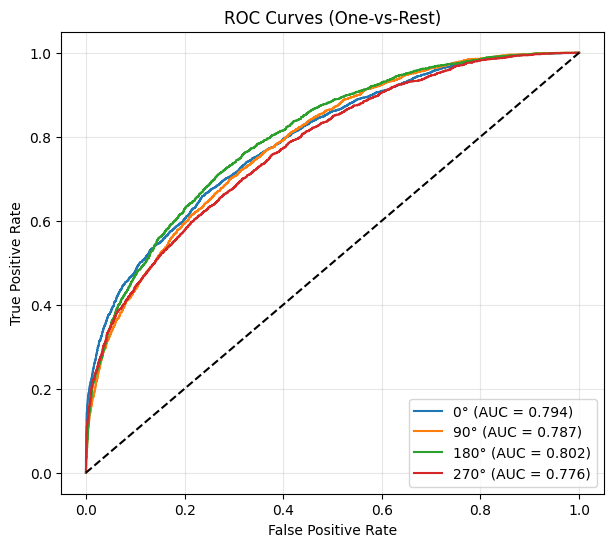


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


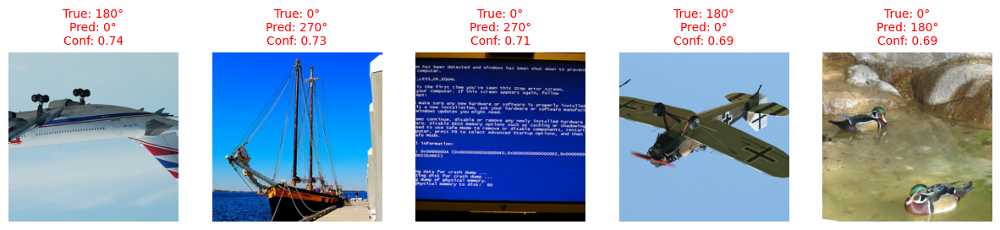

In [20]:
print("Building the model...")
model = models.efficientnet_b0(weights = None)

# Modifichiamo l'ultimo layer (Fully Connected) per avere 4 output (0, 90, 180, 270)
num_ftrs = model.classifier[1].in_features

num_ftrs = model.classifier[1].in_features
model.classifier[1] = nn.Linear(num_ftrs, 4)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/2/fullTraining_EfficientNetB0.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## EfficientNet_B0 fine-tuning

Building the model...
Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.9174


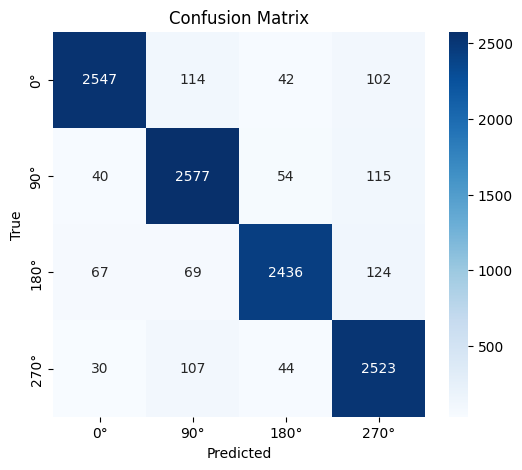


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.9490    0.9080    0.9280      2805
         90°     0.8988    0.9250    0.9117      2786
        180°     0.9457    0.9036    0.9241      2696
        270°     0.8809    0.9331    0.9062      2704

    accuracy                         0.9174     10991
   macro avg     0.9186    0.9174    0.9175     10991
weighted avg     0.9187    0.9174    0.9176     10991


ROC CURVES


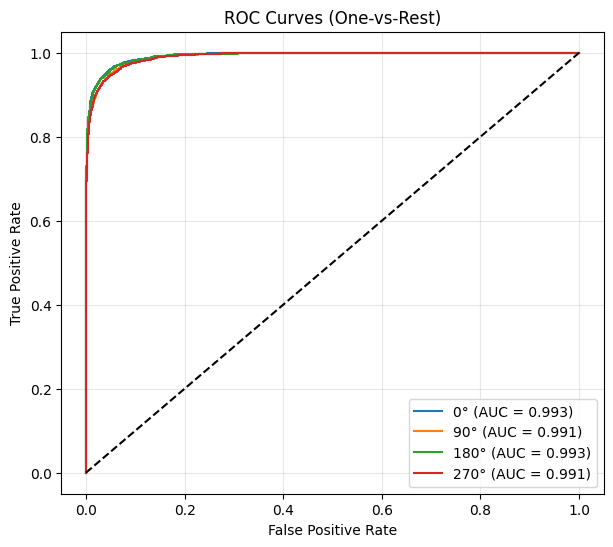


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


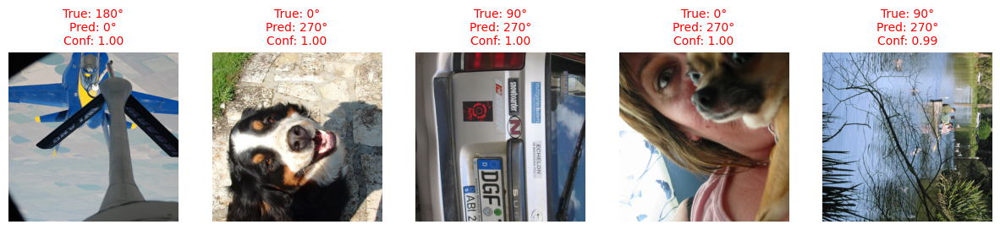

In [21]:
print("Building the model...")
model = models.efficientnet_b0(weights=None)
    
num_ftrs = model.classifier[1].in_features
model.classifier[1] = nn.Linear(num_ftrs, 4)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fineTuning_EfficientNetB0.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## Inception_V3 full training 

Inception V3 use a different image shape tipically, so let's build the dataset with images of size 299x299.

In [22]:
print("Adjusting the dataset for Incepton V3...")
test_dataset = RotationDataset(test_files, images_dir, transform=transform_pipeline_inception)

test_loader = DataLoader(
    test_dataset,
    batch_size=128,
    shuffle=False
)

Adjusting the dataset for Incepton V3...


Building the model...


/usr/local/lib/python3.12/dist-packages/torchvision/models/inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.7210


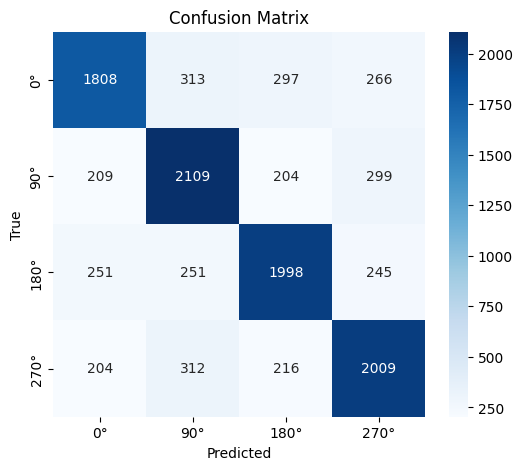


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.7314    0.6736    0.7013      2684
         90°     0.7065    0.7476    0.7265      2821
        180°     0.7359    0.7279    0.7319      2745
        270°     0.7127    0.7329    0.7227      2741

    accuracy                         0.7210     10991
   macro avg     0.7216    0.7205    0.7206     10991
weighted avg     0.7215    0.7210    0.7207     10991


ROC CURVES


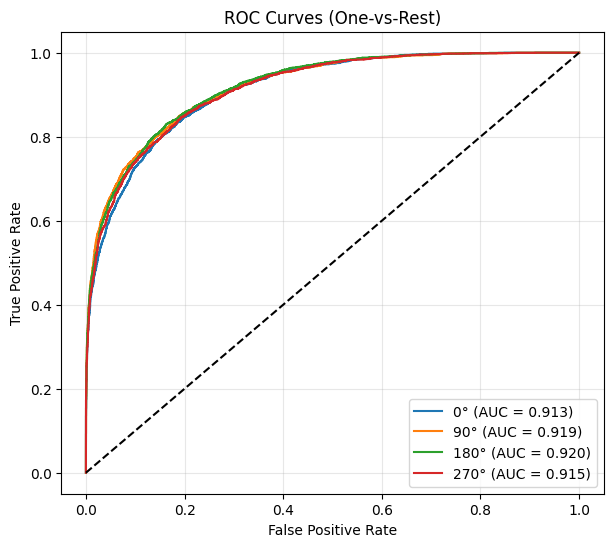


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


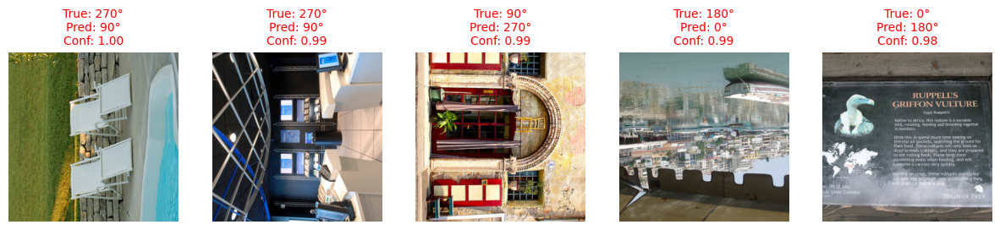

In [23]:
print("Building the model...")
model = models.inception_v3(weights=None, aux_logits=False)

# Handle the primary net
model.fc = nn.Linear(model.fc.in_features, 4)
# Handle the auxilary net
# model.AuxLogits.fc = nn.Linear(model.AuxLogits.fc.in_features, 4)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fullTraining_InceptionV3_nocropmix.pth", map_location=device), strict=False)
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## Inception_V3 full training with CropMix

Building the model...


/usr/local/lib/python3.12/dist-packages/torchvision/models/inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.7992


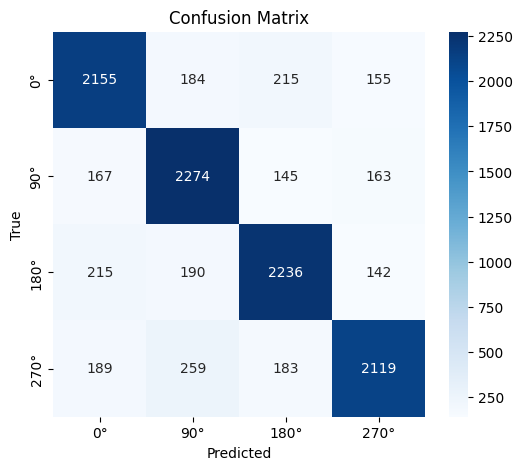


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.7905    0.7955    0.7930      2709
         90°     0.7822    0.8272    0.8041      2749
        180°     0.8046    0.8034    0.8040      2783
        270°     0.8216    0.7705    0.7953      2750

    accuracy                         0.7992     10991
   macro avg     0.7998    0.7992    0.7991     10991
weighted avg     0.7998    0.7992    0.7991     10991


ROC CURVES


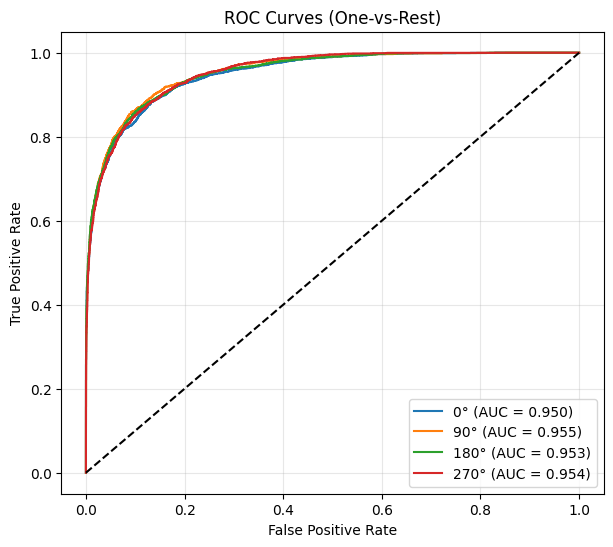


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


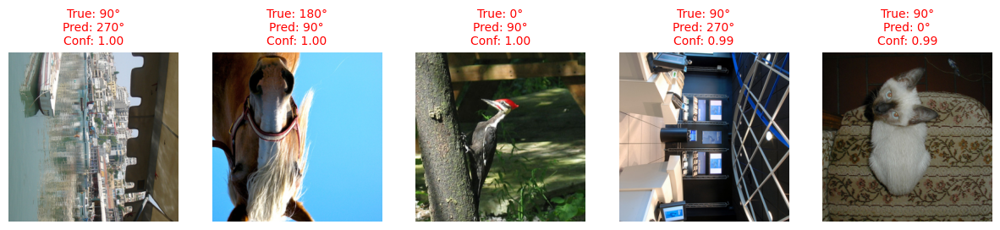

In [24]:
print("Building the model...")
model = models.inception_v3(weights=None, aux_logits=False)
    
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_ftrs, num_ftrs),  # Hidden layer (maintains size or reduces)
    nn.ReLU(),                      # Non-linearity (Crucial!)
    nn.Linear(num_ftrs, 4)          # Output layer
)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fullTraining_InceptionV3.pth", map_location=device))
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)

## Inception_V3 fine-tuning

Building the model...


/usr/local/lib/python3.12/dist-packages/torchvision/models/inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


Loading the model weights...
Starting the evaluation...

Test Accuracy: 0.7824


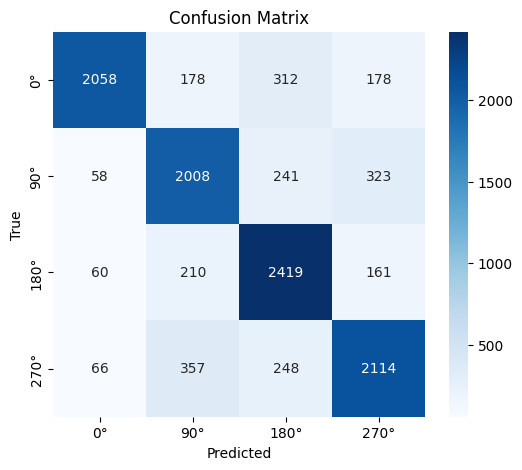


CLASSIFICATION REPORT
              precision    recall  f1-score   support

          0°     0.9179    0.7550    0.8285      2726
         90°     0.7294    0.7635    0.7461      2630
        180°     0.7512    0.8488    0.7970      2850
        270°     0.7615    0.7591    0.7603      2785

    accuracy                         0.7824     10991
   macro avg     0.7900    0.7816    0.7830     10991
weighted avg     0.7900    0.7824    0.7833     10991


ROC CURVES


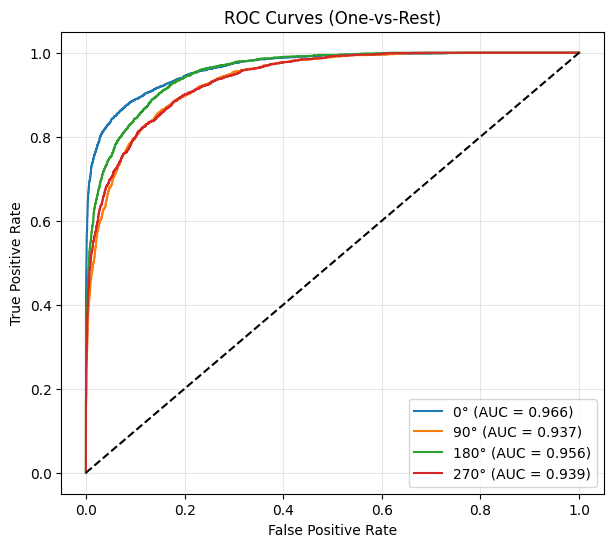


3. TOP CONFIDENT FAILURES (Visual Inspection)
These are images where the model was very confident but WRONG.


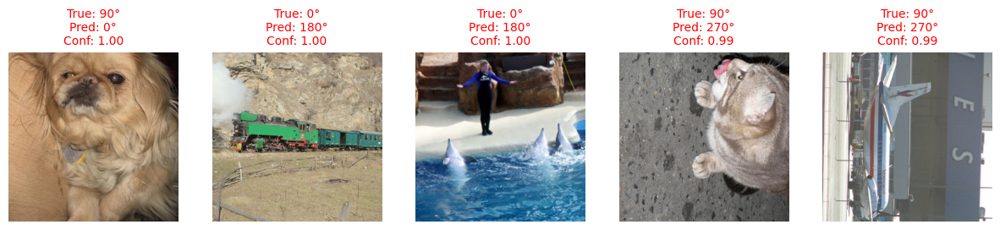

In [25]:
print("Building the model...")
model = models.inception_v3(weights=None, aux_logits=False)

# Handle the primary net
model.fc = nn.Linear(model.fc.in_features, 4)
# Handle the auxilary net
# model.AuxLogits.fc = nn.Linear(model.AuxLogits.fc.in_features, 4)

print("Loading the model weights...")
model.load_state_dict(torch.load("/kaggle/input/image-orientation-pretext-task-models/pytorch/default/1/fineTuning_InceptionV3.pth", map_location=device), strict=False)
model.to(device)

print("Starting the evaluation...")
evaluate_model(model, test_loader, class_names)